In [1]:
%load_ext autoreload
%autoreload 2
import os, sys
import numpy as np
import pandas as pd
import scanpy as sc
import PINN
import torch

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import palantir

In [3]:
os.chdir("/ssd/users/Wergillius/Project/PINN_dynamics")

In [4]:
plt.rcParams['figure.dpi']=60
plt.rcParams['figure.figsize']=(2.5,2.5)

# load model and get the growth and velocity

In [5]:
from PINN import reader

In [6]:
meahr_monocle = sc.read_h5ad("data/meahr_monocle.h5ad")

In [7]:
meahr_monocle

AnnData object with n_obs × n_vars = 10104 × 7006
    obs: 'barcodes', 'pseudodynamics_branch_class', 'palantir_pseudotime', 'branching_region', 'branch_class', 'time', 'batch', 'pseudotime', 'cell', 'batch_to_match', 'pseudotime_scaled', 'timepoint_tx_days'
    var: 'TC_MAGIC_pdt_r', 'NK_MAGIC_pdt_r'
    uns: 'DM_EigenValues', 'Time_x_colors', 'Time_y_colors', 'diffmap_evals', 'dpt_changepoints', 'dpt_grouptips', 'iroot', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'palantir_waypoints', 'pca', 'pop', 'pseudodynamics_branch_class_colors', 'umap'
    obsm: 'Cbl_Lpxn_scaled', 'Cbl_Rps6ka3_scaled', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'Delta_DM', 'X_Cbl_Adam19', 'X_Cbl_Lpxn', 'X_Cbl_Mllt3', 'X_Cbl_Rps6ka3', 'X_dc', 'X_diffmap', 'X_pca', 'X_tsne', 'X_umap', 'branch_masks', 'diff component', 'fated_pdt', 'palantir_fate_probabilities', 'palantir_fated_pdt', 'pseudotime_scaled'
    varm: 'PCs', 'gene_trends_NK', 'gene_trends_TC'
    layers: 'Counts', 

In [8]:
from PINN import pl
def aggregate_params_by_pseudotime(params, param_names='g v2', timepoints=None, adata=meahr_monocle, pseudotime_key='pseudotime_scaled'):
    
    # PINN.pl.params_in_umap(adata, params, param=param_names, cell_of_t=True);
    pl.params_in_umap(adata, params, param=param_names, timepoints=timepoints, copy=False, cell_of_t=False);
    
    pdt_bins = np.linspace(0,1,101)
    pdt_label = (pdt_bins[1:] + pdt_bins[:-1])/2
    adata.obs['pseudotime_bin'] = pd.cut(adata.obs[pseudotime_key], bins=100,
                                                labels = pdt_label)


    timepoints = adata.uns['pop']['t'] if timepoints is None else timepoints 
    fig, axs = plt.subplots(1, len(timepoints), figsize=(4*len(timepoints)+1,3), gridspec_kw={"wspace":0.4, 'hspace':0.3})
    axs = axs.flatten() if len(timepoints)>1 else [axs]
    
    for i,t in enumerate(timepoints):
        y_col = 'Day%s_'%t + param_names
        data = adata.obs[['pseudotime_bin', y_col]]
        gdata = data.groupby("pseudotime_bin").agg("mean").reset_index()

        x = np.sort(gdata.pseudotime_bin.unique())
        y = gdata[y_col].values

        model2 = np.poly1d(np.polyfit(x, gdata[y_col], 7))

        x_smooth = (x[1:] + x[:-1] )/2
        y_smooth = (y[1:] + y[:-1] )/2

        axs[i].scatter(x_smooth, y_smooth, alpha=0.3)
        axs[i].plot(x, model2(x), color='red', alpha=0.6)
        

# test mellon

In [9]:
import mellon

In [10]:
X = meahr_monocle.obsm['DM_EigenVectors'].copy()
X_times = meahr_monocle.obs['time'].values

In [11]:
# this code is here to prevent accidental usage of default values on new data
ls_time_estimate = 1.5 * np.mean(np.diff(np.sort(np.unique(X_times))))
print(ls_time_estimate)

# Initialize the time-sensitive density estimator with an intrinsic dimensionality of 2
t_est = mellon.TimeSensitiveDensityEstimator(d=None, ls_time=ls_time_estimate)

t_est.fit(X, X_times)

# Save the predictor for later density evaluations
density_predictor = t_est.predict

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


1.5
[2025-01-15 20:52:35,485] [INFO    ] Using sparse Gaussian Process since n_landmarks (5,000) < n_samples (10,104) and rank = 1.0.
[2025-01-15 20:52:35,505] [INFO    ] Computing nearest neighbor distances within time points.


[2025-01-15 20:52:38,485] [WARNING ] The computed nearest neighbor distances (`nn_distances` attribute) contain 8 invalid values: 0 NaN, 0 infinite, 8 less or equal 0. Please check the input data. Setting invalid distances to the minimum positive value found.
[2025-01-15 20:52:38,711] [INFO    ] Using covariance function (Matern52(active_dims=slice(None, -1, None), ls=0.016520628779160614) * Matern52(active_dims=-1, ls=1.5)).
[2025-01-15 20:52:38,855] [INFO    ] Computing 5,000 landmarks with k-means clustering.
[2025-01-15 20:52:50,559] [INFO    ] Using rank 5,000 covariance representation.
[2025-01-15 20:52:51,652] [INFO    ] Running inference using L-BFGS-B.
[2025-01-15 20:53:01,680] [INFO    ] Computing predictive function.


In [12]:
log_u_mellon = []
for time in meahr_monocle.uns['pop']['t']:
    log_u_mellon.append(density_predictor(X, time))
log_u_mellon = np.stack(log_u_mellon)
print(log_u_mellon.shape)

(8, 10104)


prediction of shape (8, 10104)


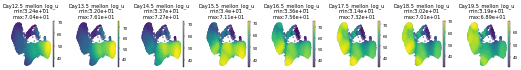

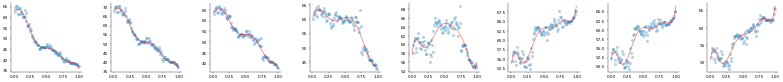

In [13]:
with plt.rc_context({'figure.dpi':30}):
    aggregate_params_by_pseudotime(log_u_mellon, 'mellon_log_u')

In [14]:
bw = 0.3
n_timepoint = 8
n_dimension = 7

train_DS = reader.TwoTimpepoint_AnnDS(
                    AnnData=meahr_monocle, 
                    timepoint_idx=None, 
                    n_dimension = n_dimension,
                    cellstate_key='DM_EigenVectors_multiscaled',  #'DM_EigenVector'
                    log_transform=False,
                    norm_time='min_minus',
                    deltax_key='Delta_DM',
                    kde_kws = {"bw_method":bw},
                    batchsize=200)

u_b = train_DS.u_b.numpy()

Computing density :
`density_funs` not specified, use gaussian kde


prediction of shape (8, 10104)


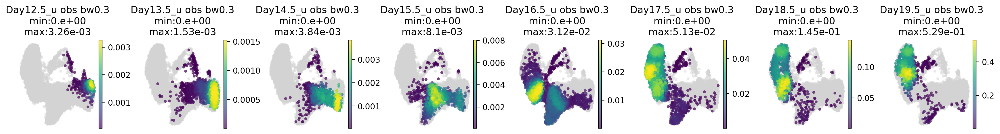

In [22]:
%matplotlib inline
with plt.rc_context({"figure.dpi":200}): 
    PINN.pl.params_in_umap(train_DS.adata, u_b, param=f'u obs bw{bw}');

## load model

In [16]:
device = 'cuda:3'

In [17]:
log_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n8/pde_params_tsense/lightning_logs/"

ckpt_dict = {}
ckpt_dict["v0_ckpt"] = f"{log_dir}/version_0/checkpoints/epoch=240-total_loss=10.81558990.ckpt" 
ckpt_dict["v1_ckpt"] = f"{log_dir}/version_1/checkpoints/epoch=146-total_loss=8.45054054.ckpt"
ckpt_dict["v2_ckpt"] = f"{log_dir}/version_2/checkpoints/epoch=259-total_loss=22.66468239.ckpt"
ckpt_dict["v3_ckpt"] = f"{log_dir}/version_3/checkpoints/epoch=240-total_loss=48.43002319.ckpt"
ckpt_dict["v4_ckpt"] = f"{log_dir}/version_4/checkpoints/epoch=204-total_loss=74.89583588.ckpt"


def simulate_u(pde_model):
    timepoint_idx = None
    u_int_all = PINN.tl.density_shortterm_simulation(pde_model, train_DS, timepoints=train_DS.T_b/pde_model.time_scale_factor)
    u_int_all = np.concatenate([u_b[0].reshape(1,-1), u_int_all], axis=0)
    return u_int_all

u_sim = {}
params = {}

for v in [0,1,2,3,4]:
    # load
    model = PINN.models.pde_params.load_from_checkpoint(ckpt_dict[f'v{v}_ckpt'], map_location=device)
    
    param_ays = model.predict_param(train_DS)
    for i,p in enumerate(['v','g','D']):
        params[f'{p}_v{v}'] = param_ays[i]

    u_sim[str(v)] = simulate_u(model)
    del model

0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


In [18]:
# short-term

prediction of shape (8, 10104)


prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)


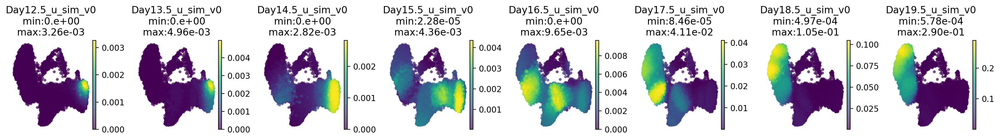

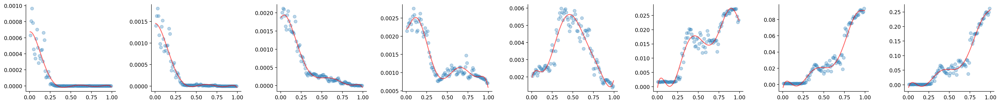

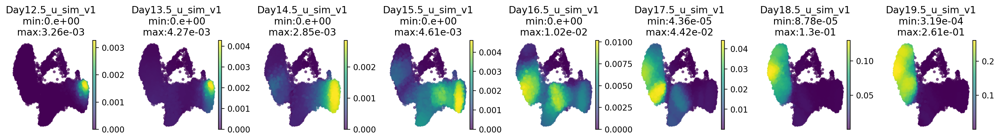

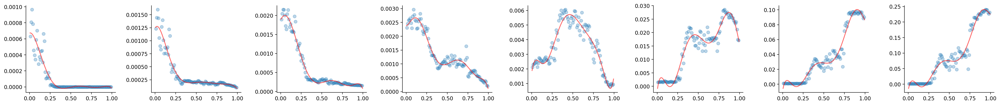

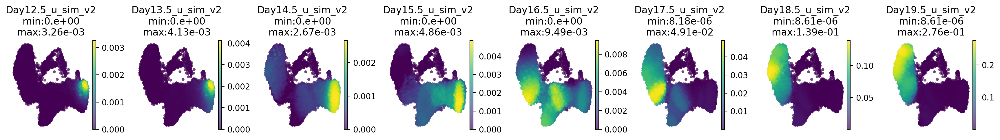

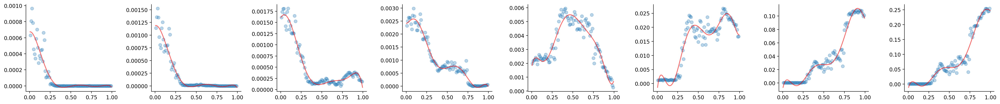

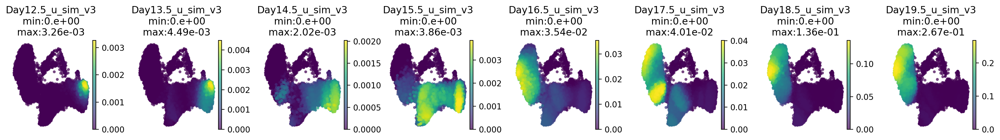

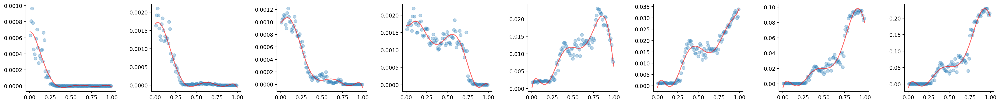

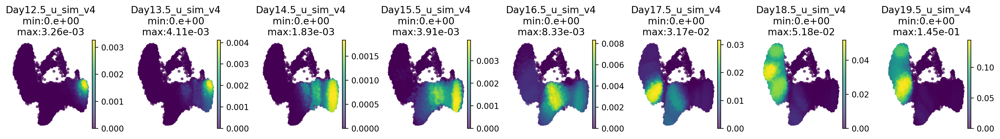

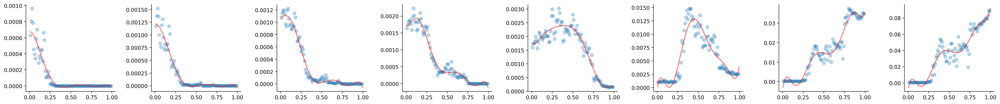

In [21]:
# change the dpi
with plt.rc_context({"figure.dpi":200}): 
    for v in [0,1,2,3,4]:
        aggregate_params_by_pseudotime(u_sim[f'{v}'], 
                param_names=f'u_sim_v{v}', pseudotime_key='pseudotime_scaled')

prediction of shape (8, 10104)


prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)


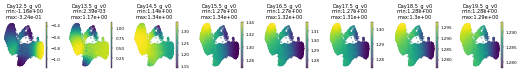

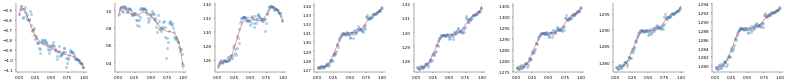

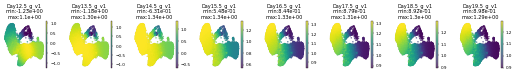

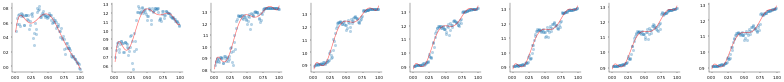

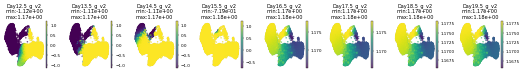

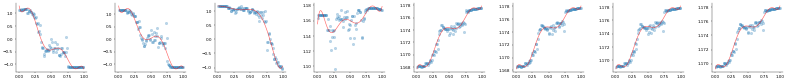

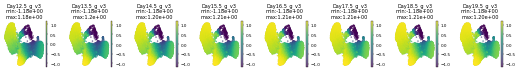

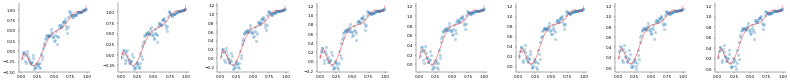

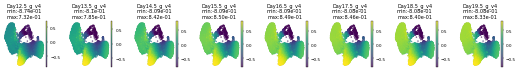

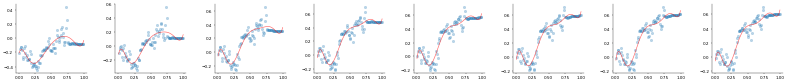

In [75]:
# change the dpi
with plt.rc_context({"figure.dpi":30}): 
    for v in [0,1,2,3,4]:
        aggregate_params_by_pseudotime(params[f'g_v{v}'], 
                param_names=f'g_v{v}', pseudotime_key='pseudotime_scaled')

# time invariant params

In [86]:
ckpt_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n8/pde_params/lightning_logs"
test_ckpt = f"{ckpt_dir}/test_version/checkpoints/epoch=84-total_loss=21.41970634.ckpt"

test_model = PINN.models.pde_params.load_from_checkpoint(test_ckpt)

In [114]:
def simulate_u(pde_model, train_DS):
    timepoint_idx = None
    u_int_all = PINN.tl.density_shortterm_simulation(pde_model, train_DS, timepoints=train_DS.T_b/pde_model.time_scale_factor)
    u_int_all = np.concatenate([train_DS.u_b[0].numpy().reshape(1,-1), u_int_all], axis=0)
    return u_int_all
    

ckpt_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n8/pde_params/lightning_logs"

inv_ckpt = {}
inv_ckpt['ckpt_v0'] = f"{ckpt_dir}/version_0/checkpoints/epoch=14-total_loss=150.58837891.ckpt"
inv_ckpt['ckpt_v1'] = f"{ckpt_dir}/version_1/checkpoints/epoch=13-total_loss=163.58467102.ckpt"
inv_ckpt['ckpt_v2'] = f"{ckpt_dir}/version_2/checkpoints/epoch=16-total_loss=109.97787476.ckpt"
inv_ckpt['ckpt_v3'] = f"{ckpt_dir}/version_3/checkpoints/epoch=11-total_loss=163.42716980.ckpt"
inv_ckpt['ckpt_v4'] = f"{ckpt_dir}/version_4/checkpoints/epoch=12-total_loss=141.16398621.ckpt"
inv_ckpt['ckpt_vtest'] = f"{ckpt_dir}/test_version/checkpoints/epoch=84-total_loss=21.41970634.ckpt"

model_inv = {}
u_sim_inv = {}
params_inv = {}
for v in [0,1,2,3,4,'test']:
    model_inv[f'{v}'] = PINN.models.pde_params.load_from_checkpoint(inv_ckpt[f'ckpt_v{v}'])
    
    param_ays = model_inv[f'{v}'].predict_param(train_DS)
    for i,p in enumerate(['v','g','D']):
        params_inv[f'{p}_v{v}'] = param_ays[i]

    u_sim = simulate_u( model_inv[f'{v}'], train_DS);
    print(v, u_sim.sum(axis=1))

    u_sim_inv[str(v)] = u_sim

prediction of shape (1, 10104)
prediction of shape (8, 10104)


prediction of shape (1, 10104)
prediction of shape (8, 10104)
prediction of shape (1, 10104)
prediction of shape (8, 10104)
prediction of shape (1, 10104)
prediction of shape (8, 10104)
prediction of shape (1, 10104)
prediction of shape (8, 10104)
prediction of shape (1, 10104)
prediction of shape (8, 10104)


/ssd/users/Wergillius/Project/PINN_dynamics/PINN/plotting_fns/density_plot.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axs = plt.subplots(1, n_timepoints, **subplot_kws)


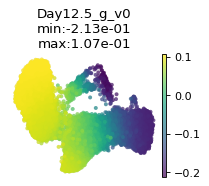

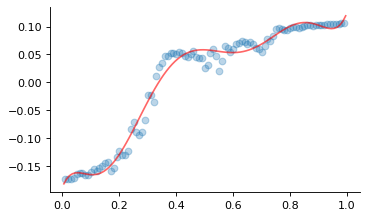

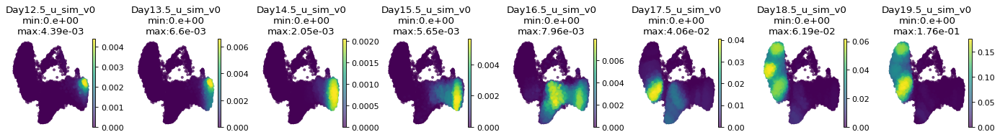

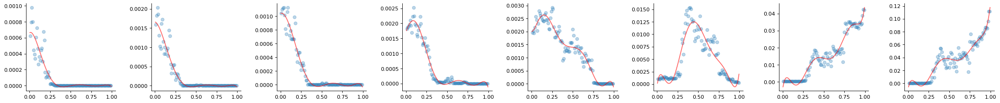

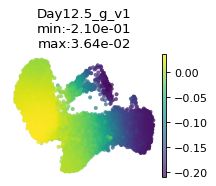

...

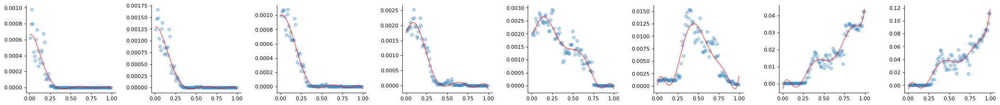

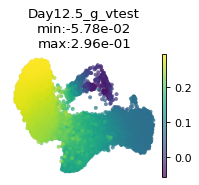

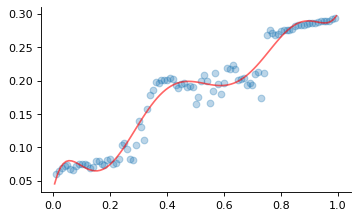

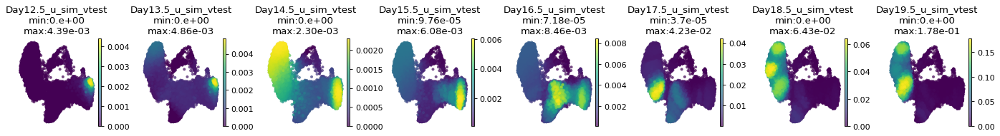

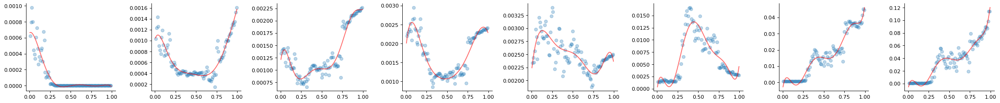

In [115]:
with plt.rc_context({"figure.dpi":80}): 
    for v in [0,1,2,3,4,'test']:
        aggregate_params_by_pseudotime(params_inv[f'g_v{v}'][[0]], param_names=f'g_v{v}',
                                   timepoints=train_DS.popD['t'][[0]],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_DS.adata)
        
        aggregate_params_by_pseudotime(u_sim_inv[str(v)], param_names=f'u_sim_v{v}',
                                   timepoints=train_DS.popD['t'],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_DS.adata)

# timepoints [1,2,3,4]

In [108]:
timepoint_idx = [1,2,3,4]

bw = 0.5
n_timepoint = len(timepoint_idx)
n_dimension = 7

train_t4_DS = reader.TwoTimpepoint_AnnDS(
                    AnnData=meahr_monocle, 
                    timepoint_idx = timepoint_idx, 
                    n_dimension = n_dimension,
                    cellstate_key='DM_EigenVectors_multiscaled',  #'DM_EigenVector'
                    log_transform=False,
                    norm_time='min_minus',
                    deltax_key='Delta_DM',
                    kde_kws = {"bw_method":bw},
                    batchsize=200)

u_t4 = train_t4_DS.u_b.numpy()

Computing density :
`density_funs` not specified, use gaussian kde


In [ ]:
device = 'cuda:3'

In [101]:
ckpt_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n[1, 2, 3, 4]/pde_params/lightning_logs/"

t4_ckpt = {}
t4_ckpt['ckpt_v0'] = f"{ckpt_dir}/version_0/checkpoints/epoch=80-total_loss=8.68898964.ckpt"
t4_ckpt['ckpt_v1'] = f"{ckpt_dir}/version_1/checkpoints/epoch=52-total_loss=35.91765976.ckpt"
t4_ckpt['ckpt_v2'] = f"{ckpt_dir}/version_2/checkpoints/epoch=37-total_loss=48.05711746.ckpt"
t4_ckpt['ckpt_v3'] = f"{ckpt_dir}/version_3/checkpoints/epoch=57-total_loss=69.78382874.ckpt"

for v in [0,1,2,3]:
    globals()[f'model_t4_v{v}'] = PINN.models.pde_params.load_from_checkpoint(t4_ckpt[f'ckpt_v{v}'])
    

In [110]:
params = {}
for v in [0,1,2,3]:
    param_ays = globals()[f'model_t4_v{v}'].predict_param(train_t4_DS)
    for i,p in enumerate(['v','g','D']):
        params[f'{p}_v{v}'] = param_ays[i]

    with plt.rc_context({"figure.dpi":10}): 
        aggregate_params_by_pseudotime(param_ays[1][[0]], param_names=f'g_v{v}',
                                    timepoints=train_t4_DS.popD['t'][[0]],
                                        pseudotime_key='pseudotime_scaled', 
                                        adata=train_t4_DS.adata)

prediction of shape (1, 6315)
prediction of shape (1, 6315)
prediction of shape (1, 6315)


prediction of shape (1, 6315)


# timepoints [1,2,3,4,5]

In [78]:
timepoint_idx = [1,2,3,4,5]

bw = 0.2
n_timepoint = len(timepoint_idx)
n_dimension = 7

train_t5_DS = reader.TwoTimpepoint_AnnDS(
                    AnnData=meahr_monocle, 
                    timepoint_idx = timepoint_idx, 
                    n_dimension = n_dimension,
                    cellstate_key='DM_EigenVectors_multiscaled',  #'DM_EigenVector'
                    log_transform=False,
                    norm_time='min_minus',
                    deltax_key='Delta_DM',
                    kde_kws = {"bw_method":bw},
                    batchsize=200)

u_t5 = train_t5_DS.u_b.numpy()

Computing density :
`density_funs` not specified, use gaussian kde


prediction of shape (5, 8282)


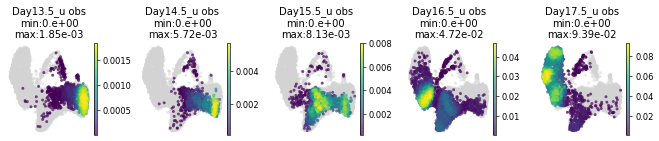

In [79]:
PINN.pl.params_in_umap(train_t5_DS.adata, u_t5,  train_t5_DS.popD['t'], 'u obs');

In [80]:
device = 'cuda:3'

In [82]:
def simulate_u(pde_model, train_DS):
    timepoint_idx = None
    u_int_all = PINN.tl.density_shortterm_simulation(pde_model, train_DS, timepoints=train_DS.T_b/pde_model.time_scale_factor)
    u_int_all = np.concatenate([train_DS.u_b[0].numpy().reshape(1,-1), u_int_all], axis=0)
    return u_int_all
    

ckpt_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n[1, 2, 3, 4, 5]/pde_params/lightning_logs"

t5_ckpt = {}
t5_ckpt['ckpt_v0'] = f"{ckpt_dir}/version_0/checkpoints/epoch=36-total_loss=15.24166965.ckpt"
t5_ckpt['ckpt_v1'] = f"{ckpt_dir}/version_1/checkpoints/epoch=23-total_loss=8.90282345.ckpt"
t5_ckpt['ckpt_v2'] = f"{ckpt_dir}/version_2/checkpoints/epoch=53-total_loss=70.84193420.ckpt"
t5_ckpt['ckpt_v3'] = f"{ckpt_dir}/version_3/checkpoints/epoch=59-total_loss=73.38562775.ckpt"

model_t5 = {}
u_sim_t5 = {}
params_t5 = {}
for v in [0,1,2,3]:
    model_t5[f'{v}'] = PINN.models.pde_params.load_from_checkpoint(t5_ckpt[f'ckpt_v{v}'])
    
    param_ays = model_t5[f'{v}'].predict_param(train_t5_DS)
    for i,p in enumerate(['v','g','D']):
        params_t5[f'{p}_v{v}'] = param_ays[i]

    u_sim = simulate_u( model_t5[f'{v}'], train_t5_DS)
    print(v, u_sim.sum(axis=1))

    u_sim_t5[str(v)] = u_sim

with plt.rc_context({"figure.dpi":70}): 
    for v in [0,1,2,3]:
        aggregate_params_by_pseudotime(u_sim_t5[str(v)], param_names=f'u_sim_v{v}',
                                   timepoints=train_t5_DS.popD['t'],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_t5_DS.adata)

with plt.rc_context({"figure.dpi":30}): 
    for v in [0,1,2,3]:
        aggregate_params_by_pseudotime(params_t5[f'g_v{v}'][[0]], param_names=f'g_v{v}',
                                   timepoints=train_t5_DS.popD['t'][[0]],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_t5_DS.adata)

0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2


simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
0 [ 1.6886228  4.009267  11.855184  25.708603  71.11048  ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
1 [  1.6886228   5.2339516  12.545848   41.734512  153.69376  ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
2 [ 1.6886228 16.39924   13.16584   21.79041   61.394814 ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
3 [  1.6886228  27.10742    18.683846   67.37338   129.05626  ]


prediction of shape (5, 8282)


/ssd/users/Wergillius/Project/PINN_dynamics/PINN/plotting_fns/param_plot.py:60: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[f'Day{t}_{param}'] = prediction[i]


prediction of shape (5, 8282)
prediction of shape (5, 8282)
prediction of shape (5, 8282)


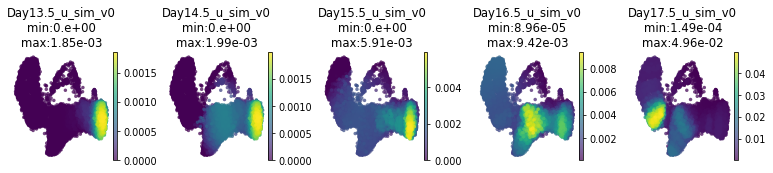

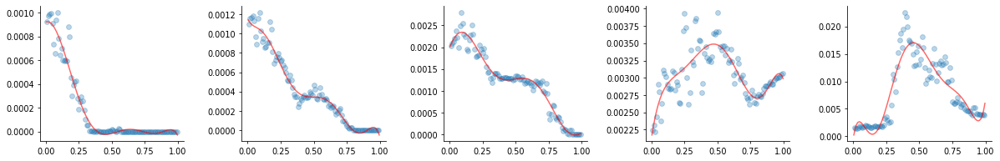

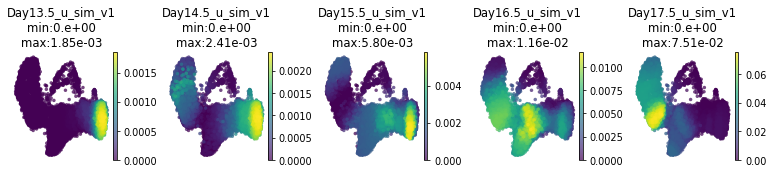

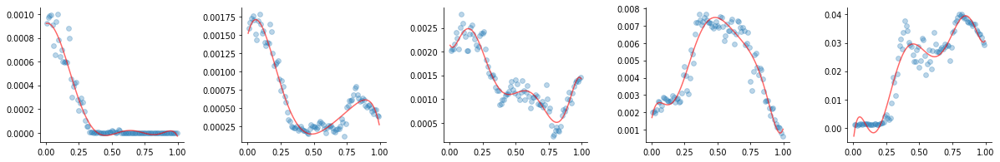

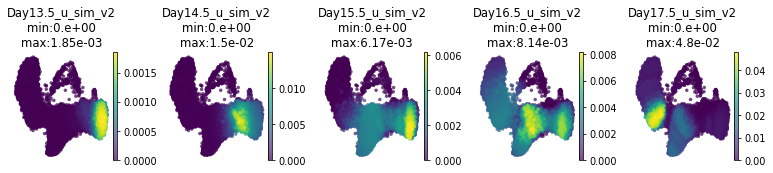

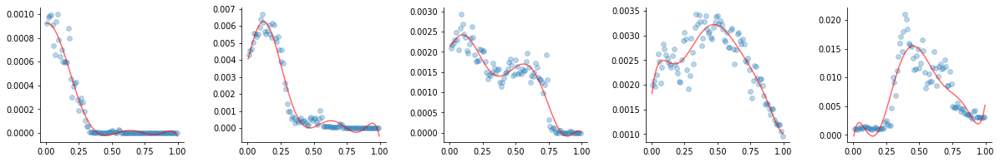

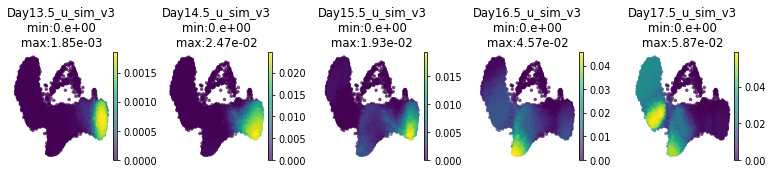

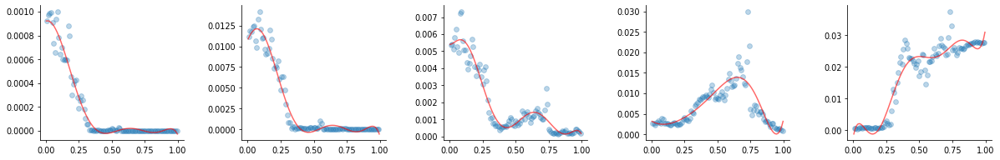

In [84]:
with plt.rc_context({"figure.dpi":70}): 
    for v in [0,1,2,3]:
        aggregate_params_by_pseudotime(u_sim_t5[str(v)], param_names=f'u_sim_v{v}',
                                   timepoints=train_t5_DS.popD['t'],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_t5_DS.adata)

prediction of shape (1, 8282)
prediction of shape (1, 8282)
prediction of shape (1, 8282)
prediction of shape (1, 8282)


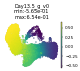

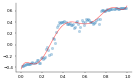

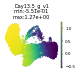

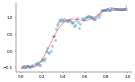

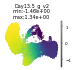

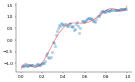

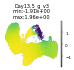

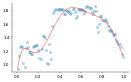

In [98]:
with plt.rc_context({"figure.dpi":30}): 
    for v in [0,1,2,3]:
        aggregate_params_by_pseudotime(params_t5[f'g_v{v}'][[0]], param_names=f'g_v{v}',
                                   timepoints=train_t5_DS.popD['t'][[0]],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_t5_DS.adata)

# cell cycle

In [23]:
cellcycle = pd.read_table("data/mouse_geneset/regev_lab_cell_cycle_gene_mouse.txt", names=['gene'])

In [24]:
genes = cellcycle['gene'].values

In [25]:
s_gene = genes[:44]
g2m_gene = genes[44:]

In [26]:
sc.tl.score_genes_cell_cycle(meahr_monocle, s_genes = s_gene, g2m_genes = g2m_gene)

In [27]:
pdt_bins = np.linspace(0,1,11)
pdt_label = (pdt_bins[1:] + pdt_bins[:1])/2
meahr_monocle.obs['pseudotime_bin'] = pd.cut(meahr_monocle.obs['pseudotime'], bins=10,
                                             labels = pdt_label)

In [28]:
def cellcycle_stackbar(adata, time_col='pseudotime_bin'):
    
    df = adata.obs.groupby([time_col,'phase']).agg({'batch_y':'count'}).reset_index()
    
    n_bar = df[time_col].nunique()
    x = df[time_col].unique()

    dfs = []
    for t in x:
        df_t = df.query(f"`{time_col}` == @t")
        total = df_t.batch_y.values.sum()
        df_t.loc[:,'proportion'] = df_t['batch_y'] / total ;

        dfs.append(df_t)

    normed_df = pd.concat(dfs)


    base = np.zeros((n_bar,))

    for phase in normed_df.phase.unique():
        
        pro_t = normed_df.query('`phase` == @phase')
        height = pro_t.sort_values(time_col)['proportion'].values

        plt.bar(x=range(n_bar), height=height, label=phase, bottom=base, width=0.7)

        base += height

        plt.xticks(ticks=range(n_bar),labels=np.around(x,3))

    plt.legend(bbox_to_anchor=(1,0.4,0.3,0.1))

In [29]:
cellcycle_stackbar(meahr_monocle, 'pseudotime_bin');

KeyError: "Column(s) ['batch_y'] do not exist"

/tmp/ipykernel_3581870/3634918386.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_t.loc[:,'proportion'] = df_t['batch_y'] / total ;
/tmp/ipykernel_3581870/3634918386.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_t.loc[:,'proportion'] = df_t['batch_y'] / total ;
/tmp/ipykernel_3581870/3634918386.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

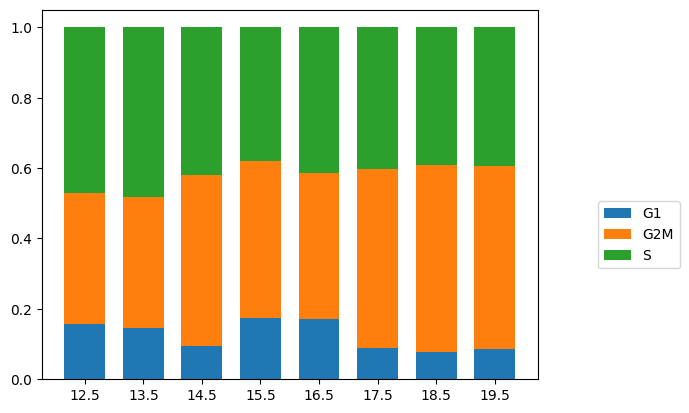

In [94]:
cellcycle_stackbar(meahr_monocle, 'time');